### Read the data on the SPX index; the first column is the "total return" which incorporates corporate actions

In [1]:
lines = readlines("../data/sp.txt")

24420-element Array{String,1}:
 " "                                                                                                                                                                                                                                                               
 "                                                                                                                                                                                                                                                                "
 " "                                                                                                                                                                                                                                                               
 "   caldt        vwretd        sprtrn      spindx"                                                                                                                                          

### Work out which row the data seems to start on

In [2]:
length.(lines)

24420-element Array{Int64,1}:
   1
 256
   1
  48
   0
  48
  48
  48
  48
  48
  48
  48
  48
   ⋮
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48
  48

### Check the intermediate rows

In [3]:
unique(length.(lines[6:end]))

1-element Array{Int64,1}:
 48

### Isolate the first column

In [4]:
[line[14:22] for line in lines[7:end]]

24414-element Array{String,1}:
 " 0.004297"
 "-0.001357"
 "-0.004603"
 " 0.000537"
 " 0.003907"
 "-0.002693"
 " 0.002218"
 "-0.006515"
 "-0.001597"
 " 0.003465"
 "-0.005732"
 "-0.012153"
 "-0.000511"
 ⋮          
 " 0.002792"
 "-0.000889"
 "-0.002019"
 "-0.003911"
 " 0.001673"
 "-0.006173"
 " 0.001880"
 "-0.013623"
 " 0.002201"
 "-0.008636"
 " 0.006236"
 " 0.000819"

### Parse the first column

In [5]:
returns = [parse(Float64,line[14:22]) for line in lines[7:end]]

24414-element Array{Float64,1}:
  0.004297
 -0.001357
 -0.004603
  0.000537
  0.003907
 -0.002693
  0.002218
 -0.006515
 -0.001597
  0.003465
 -0.005732
 -0.012153
 -0.000511
  ⋮       
  0.002792
 -0.000889
 -0.002019
 -0.003911
  0.001673
 -0.006173
  0.00188 
 -0.013623
  0.002201
 -0.008636
  0.006236
  0.000819

### Import some basic statistics functions

In [6]:
using StatsBase

In [7]:
using Plots

In [8]:
Pkg.add("NLopt")

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [9]:
using NLopt

In [10]:
using LinearAlgebra

In [23]:
function f(w::Vector{Float64}, g::Vector{Float64}, r::Vector{Float64}, p::Vector{Float64}, gamma::Float64)
    g[1] = gamma*dot(p, r .* (1 .+ w[1] .* r).^(gamma-1))
    return dot(p, (1 .+ w[1] .* r).^gamma) 
end

f (generic function with 1 method)

In [34]:
function findw(r::Vector{Float64}, p::Vector{Float64}, gamma::Float64)
    epsilon = 1e-8
    problem = Opt(:LD_MMA,1)
    lower_bounds!(problem,[max(-10.0,-1/maximum(r) + epsilon)])
    upper_bounds!(problem,[min(10.0,-1/minimum(r) - epsilon)])
    xtol_rel!(problem,1e-4)
    max_objective!(problem,(w,g)->f(w,g,r,p,gamma))
    (minf,w,ret)=optimize(problem,[0.5])
    @assert( ret == :XTOL_REACHED )
    return w[1]
end

findw (generic function with 1 method)

In [36]:
wrs = Vector{Float64}[]
lagyears = [1,2,5,10,25]
for lag in 252*lagyears
    push!( wrs, Float64[] )
    for year = 1:25
        trainingdata = returns[end+(year-26)*252-lag+1:end+(year-26)*252]
        (lo,hi) = StatsBase.quantile(trainingdata,[1/3,2/3])
        trainingtertiles = [searchsorted([lo,hi],r).start for r in trainingdata]
        n = [sum((trainingtertiles[1:end-1].==i).&(trainingtertiles[2:end].==j)) for i in 1:3, j in 1:3]
        P = n./sum(n,dims=2)
        
        w = fill(NaN,3)
        for i = 1:3
            p = [P[i,tt] for tt in trainingtertiles[2:end]]
            w[i] = findw(trainingdata[2:end], p, 0.5)
        end 

        statedata = returns[end+(year-26)*252:end+(year-25)*252-1]
        statetertiles = [searchsorted([lo,hi],r).start for r in statedata]

        testdata = returns[end+(year-26)*252+1:end+(year-25)*252]
        wrs[end] = vcat(wrs[end], [w[statetertiles[i]]*testdata[i] for i in 1:length(testdata)])
    end
end

w = 0.5
w = 1.3720464879064735
w = 5.149212845503706
w = 10.0
w = 10.0
w = 0.5
w = 2.2468889937957934
w = 7.562938782543399
w = 10.0
w = 10.0
w = 0.5
w = 2.466333575308232
w = 8.084246454204699
w = 10.0
w = 10.0
w = 0.5
w = 2.6945391824875498
w = 8.568515559105213
w = 10.0
w = 10.0
w = 0.5
w = -0.42322957938500716
w = -4.351867166509143
w = -10.0
w = -10.0
w = 0.5
w = -0.22024185675840213
w = -3.6529415683083655
w = -10.0
w = -10.0
w = 0.5
w = 2.716044637385193
w = 8.616049688948383
w = 10.0
w = 10.0
w = 0.5
w = 3.0887793917906015
w = 9.372334739342243
w = 10.0
w = 10.0
w = 0.5
w = 2.981561812596498
w = 9.165050753497537
w = 10.0
w = 10.0
w = 0.5
w = 2.238489444979662
w = 7.531969921256129
w = 10.0
w = 10.0
w = 0.5
w = 2.8082180483643655
w = 8.799511781762007
w = 10.0
w = 10.0
w = 0.5
w = 3.020041723865619
w = 9.218392660004096
w = 10.0
w = 10.0
w = 0.5
w = 1.886792905727338
w = 6.570967564354927
w = 10.0
w = 10.0
w = 10.0
w = 0.5
w = 3.6593681073269995
w = 10.0
w = 10.0
w = 0.5
w = 3.

w = 0.5
w = 3.6622696831299106
w = 10.0
w = 10.0
w = 0.5
w = 3.1118433791840725
w = 9.376872385197254
w = 10.0
w = 10.0
w = 0.5
w = -0.5101073015462121
w = -4.538058778235211
w = -10.0
w = -9.694699960146115
w = -9.904176749333363
w = -9.78175795835512
w = -9.891745532730095
w = -9.894554758629694
w = -9.895795664481115
w = -9.894807752834032
w = 0.5
w = 2.630382110969292
w = 8.40460889355784
w = 10.0
w = 10.0
w = 0.5
w = 2.291368916446401
w = 7.662811689860555
w = 10.0
w = 10.0
w = 0.5
w = 2.978127744882432
w = 9.137395995707845
w = 10.0
w = 10.0
w = 0.5
w = 2.290861801775727
w = 7.603945054874746
w = 10.0
w = 10.0
w = 0.5
w = 2.1172658903295107
w = 7.193223868353783
w = 10.0
w = 10.0
w = 0.5
w = -0.9151455254572465
w = -5.718960884441006
w = -10.0
w = -10.0
w = 0.5
w = 3.444218421921572
w = 9.89691935834965
w = 10.0
w = 10.0
w = 0.5
w = -2.779084011935167
w = -9.549578589675619
w = -10.0
w = -10.0
w = 0.5
w = 2.0546311394688823
w = 6.906338604351621
w = 10.0
w = 9.432353749574869
w =

w = 0.5
w = 4.219462457328179
w = 9.533145271353337
w = 6.061138121203216
w = 5.439590802372942
w = 5.5198678709706765
w = 5.550278276962582
w = 5.522923809485614
w = 5.522086920800056
w = 5.520995335622964
w = 5.521977746338794
w = 5.522001216303841
w = 0.5
w = 1.0242402762406728
w = 0.8761721809858272
w = 0.8110604747888251
w = 0.869578615520843
w = 0.8691179568141282
w = 0.8694920218672645
w = 0.5
w = -3.693422315383671
w = -8.685908840072527
w = -0.2772498620398878
w = -0.2772498620398878
w = -0.6709783673026823
w = -2.9084785741295986
w = -5.5998876053858115
w = -5.600062848819516
w = -5.602585034400238
w = -5.638668609666777
w = -6.1191732147291225
w = -8.685908840072527
w = -6.609398767804227
w = -8.685908840072527
w = -6.9351981095435375
w = -7.35637844176192
w = -6.978482633635232
w = -6.966503498096103
w = -6.952452722842873
w = -6.9650973585133285
w = -6.965407382148744
w = -6.965545855250653
w = -6.965435636818358
w = 0.5
w = 3.821081462321607
w = 10.0
w = 10.0
w = 0.5
w = 

w = 0.5
w = 5.446006464320694
w = 10.0
w = 10.0
w = 0.5
w = -1.3903847385199712
w = -4.396268990607127
w = -1.9392599499441663
w = -1.9008351628921787
w = -1.9009933728807284
w = -1.9011850447073453
w = -1.9010125406144724
w = -1.9010084915027117
w = 0.5
w = -3.256391541881804
w = -9.787660193081646
w = -6.465042980841989
w = -7.889686036510512
w = -7.873657948515693
w = -7.876677966934804
w = -7.88056477667408
w = -7.87706687460986
w = -7.876982800964489
w = 0.5
w = 5.966172279120801
w = 10.0
w = 10.0
w = 0.5
w = 2.0902198293194725
w = 5.319917498339823
w = 2.8022914405473016
w = 3.0195906117793045
w = 2.824745973414996
w = 2.8168292692598866
w = 2.8065702553293184
w = 2.815802051102309
w = 2.8160241052933785
w = 2.8161229249596094
w = 2.8160442240447394
w = 0.5
w = -0.2503192132787788
w = -1.6270990356103965
w = -0.4354631028919792
w = -0.6399665352836559
w = -0.4565543692633339
w = -0.4513033033608556
w = -0.444548718926279
w = -0.4506272742777124
w = -0.450773564467157
w = -0.45083

w = 0.5
w = 4.412628902787578
w = 5.139195089263553
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.4936961698024875
w = 0.14094604533686717
w = 2.4079954441024682
w = 3.816740252882022
w = 4.524448786119874
w = 4.857317144161493
w = 4.857335810449551
w = 4.857604577565875
w = 0.5
w = 3.569404049667749
w = 5.139195089263553
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.4881616955443642
w = 0.15387073042427524
w = 2.4173596622556963
w = 3.8214943873265703
w = 3.8215577215841146
w = 3.82246952985172
w = 3.835562973940365
w = 4.017774055813907
w = 5.139195089263553
w = 4.377470880476724
w = 5.139195089263553
w = 4.702982739565075
w = 4.940426451423707
w = 4.72718205687277
w = 4.713507234738011
w = 4.7284848715505845
w = 4.715006488183091
w = 4.714673429463209
w = 4.714249034319439
w = 4.714630988952744
w = 4.714640149075257
w = 0.5
w = 4.179890037373121
w = 5.139195089263553
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.4600459156285837
w = 0.21913251354557683
w =

w = 0.5
w = 6.4114216700458355
w = 10.0
w = 10.0
w = 10.0
w = 0.5
w = -2.7827522963446514
w = -1.7082045308794067
w = -2.001841128073569
w = -2.0002547300712483
w = -1.999802681191011
w = -2.000209521246044
w = 0.5
w = -4.345954201485995
w = -8.685908840072527
w = -7.095890130088298
w = -5.741755290603719
w = -5.895510865000114
w = -5.889958047137514
w = -5.894955087874529
w = -5.895124695533608
w = 0.5
w = 6.581419880739481
w = 10.0
w = 10.0
w = 10.0
w = 0.5
w = -1.9838292183912145
w = -0.9081674793026875
w = -0.925911388225181
w = -0.9238801093453018
w = -0.9220881166413287
w = -0.9237008481928278
w = -0.9236236723391255
w = -0.9236851611307942
w = 0.5
w = -4.098632789232145
w = -8.685908840072527
w = -5.894859049051162
w = -4.818463706534781
w = -5.665945082429279
w = -4.915921730772896
w = -4.883839875505649
w = -4.845484162964286
w = -4.879984551150381
w = -4.880845862314814
w = -4.881228924588183
w = -4.880924010766015
w = 0.5
w = 6.576615873122841
w = 10.0
w = 10.0
w = 0.5
w = -

w = 0.5
w = -0.6897443419792026
w = -0.047859066389261073
w = -0.44929821693525657
w = -0.0921034662275465
w = -0.08979841677236712
w = -0.08707883261255402
w = -0.08952631173881233
w = -0.08958668821817385
w = -0.08961351818448361
w = -0.0895917972361535
w = -0.08958879824505014
w = 0.5
w = 5.139195089263553
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.4675205646725704
w = 0.20184719054998101
w = 2.454823100244805
w = 3.8422211381159
w = 4.536918452701941
w = 4.86321803605827
w = 5.013348936701295
w = 5.081914346134504
w = 5.081923618004333
w = 5.081969045070979
w = 0.5
w = 5.139195089263553
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.6734427009050457
w = -1.4331995214213409
w = 0.28083024996168326
w = 2.5148757548540708
w = 3.874943737080284
w = 4.553024064505529
w = 4.870892361131956
w = 5.016962817278921
w = 5.083607650509125
w = 5.113929920965883
w = 5.12771132365473
w = 5.127714803506338
w = 5.127731851049646
w = 0.5
w = 3.081652060792

w = 4.979950815931548
w = 4.979595925375464
w = 4.9795894600249895
w = 0.5
w = 4.905512772871442
w = 5.139195089263553
w = 5.139195089263553
w = 5.139195089263553
w = 4.977792081728815
w = 5.139195089263553
w = 5.048389473847225
w = 5.139195089263553
w = 5.059514364190385
w = 5.0531862006306065
w = 5.060872647209475
w = 5.053955658917243
w = 5.053777508902617
w = 5.053561190738802
w = 5.053755876549614
w = 5.053760626580772
w = 0.5
w = 4.807126398375813
w = 5.139195089263553
w = -1.0821016789376836
w = -1.0821016789376836
w = -0.8868087272717062
w = 0.647164746134453
w = 2.69973023101672
w = 3.9607408014553003
w = 4.591849886907474
w = 4.888312451976753
w = 5.024752504328277
w = 5.024759701947958
w = 5.024863337649364
w = 0.5
w = 4.103101099924235
w = 5.139195089263553
w = 5.139195089263553
w = 4.310055150129901
w = 5.139195089263553
w = 4.462365069901407
w = 4.796144480045463
w = 4.497845022398139
w = 4.489027871767938
w = 4.480438028501292
w = 4.488167774553591
w = 4.488364945108579


┌ Warning: scale log is unsupported with Plots.GRBackend().  Choose from: Symbol[:identity, :log10]
└ @ Plots /home/jrun/.julia/packages/Plots/EJpx2/src/args.jl:1168


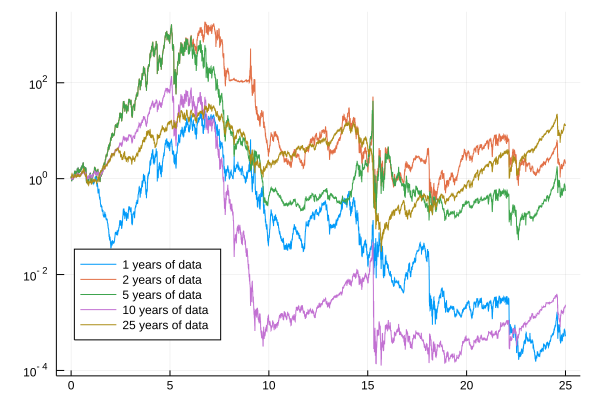

In [37]:
plot((1:length(wrs[1]))/252, cumprod(1 .+ wrs[1]), label = "$(lagyears[1]) years of data", legend=:bottomleft, yscale=:log)
[plot!((1:length(wrs[i]))/252, cumprod(1 .+ wrs[i]), label="$(lagyears[i]) years of data") for i in 2:length(wrs)][end]

In [14]:
wrs = Vector{Float64}[]
lagyears = [1,2,5,10,25]
lag = 504
    push!( wrs, Float64[] )
    year = 17
        trainingdata = returns[end+(year-26)*252-lag+1:end+(year-26)*252]
        (lo,hi) = StatsBase.quantile(trainingdata,[1/3,2/3])
        trainingtertiles = [searchsorted([lo,hi],r).start for r in trainingdata]
        n = [sum((trainingtertiles[1:end-1].==i).&(trainingtertiles[2:end].==j)) for i in 1:3, j in 1:3]
        P = n./sum(n,dims=2)
        
        w = fill(NaN,3)
        i = 3
            println( "state=$i")
            flush(stdout)
            p = [P[i,tt] for tt in trainingtertiles[2:end]]
            w[i] = findw(trainingdata[2:end], p, 0.5)
        end 
        println("Done with weights")
        flush(stdout)


state=3


AssertionError: AssertionError: ret == :XTOL_REACHED

In [11]:
function f(w::Vector{Float64}, g::Vector{Float64}, r::Vector{Float64}, p::Vector{Float64}, gamma::Float64)
    println( "w = $(w[1])")
    v = 1 .+ w[1] .* r
    if any(v.<0)
        return -Inf
    end
    g[1] = gamma*dot(p, r .* v.^(gamma-1))
    return dot(p, v.^gamma) 
end

f (generic function with 1 method)

In [31]:
wrs = Vector{Float64}[]
lagyears = [1,2,5,10,25]
lag = 504
    push!( wrs, Float64[] )
    year = 17
        trainingdata = returns[end+(year-26)*252-lag+1:end+(year-26)*252]
        (lo,hi) = StatsBase.quantile(trainingdata,[1/3,2/3])
        trainingtertiles = [searchsorted([lo,hi],r).start for r in trainingdata]
        n = [sum((trainingtertiles[1:end-1].==i).&(trainingtertiles[2:end].==j)) for i in 1:3, j in 1:3]
        P = n./sum(n,dims=2)
        
        w = fill(NaN,3)
        i = 3
            println( "state=$i")
            flush(stdout)
r = trainingdata[2:end]
p = [P[i,tt] for tt in trainingtertiles[2:end]]
gamma = 0.5
    problem = Opt(:LD_MMA,1)
    lower_bounds!(problem,[max(-10.0,1e-8-1/maximum(r))])
    upper_bounds!(problem,[min(10.0,-1e-8-1/minimum(r))])
    xtol_rel!(problem,1e-4)
    max_objective!(problem,(w,g)->f(w,g,r,p,gamma))
    (minf,w,ret)=optimize(problem,[0.5])


state=3
w = 0.5
w = -3.9713961249281704
w = -8.685908840072527
w = -0.2772498620398878
w = -0.2772498620398878
w = -0.6197049331271938
w = -2.793685053929436
w = -5.518309500477068
w = -5.518574484298125
w = -5.522387438424804
w = -5.5767984903014565
w = -6.2821792707125566
w = -8.685908840072527
w = -6.9701410117241585
w = -8.685908840072527
w = -7.401207597971156
w = -7.373537056813214
w = -7.375428330709597
w = -7.378112914748652
w = -7.375696835619295
w = -7.375640638695523


(168.3869312172884, [-7.37564], :XTOL_REACHED)

In [20]:
g = [0.0]
f([-8.69],g,r,p,0.5)

w = -8.69


-Inf

In [19]:
g

1-element Array{Float64,1}:
 0.6524106686519666

In [22]:
minmax(r)

MethodError: MethodError: no method matching minmax(::Array{Float64,1})
Closest candidates are:
  minmax(::Any, !Matched::Any) at operators.jl:427
  minmax(!Matched::T<:AbstractFloat, !Matched::T<:AbstractFloat) where T<:AbstractFloat at math.jl:569
  minmax(!Matched::T<:FixedPointNumbers.Normed, !Matched::T<:FixedPointNumbers.Normed) where T<:FixedPointNumbers.Normed at /home/jrun/.julia/packages/FixedPointNumbers/3QAEg/src/normed.jl:130
  ...

In [23]:
minimummaximum

UndefVarError: UndefVarError: minimummaximum not defined

In [25]:
w=-1/maximum(r)

-8.685908850072527

In [26]:
f([w],g,r,p,0.5)

w = -8.685908850072527


168.30081172714895

In [27]:
g

1-element Array{Float64,1}:
 Inf

In [28]:
w += 1e-8

-8.685908840072527

In [29]:
f([w],g,r,p,0.5)

w = -8.685908840072527


168.30082162368444

In [30]:
g

1-element Array{Float64,1}:
 494.8312449220477

In [32]:
epsilon

UndefVarError: UndefVarError: epsilon not defined

In [33]:
machineepsilon

UndefVarError: UndefVarError: machineepsilon not defined